# Unlocking Customer Value: Clustering for Grocery Customer Segmentation
## 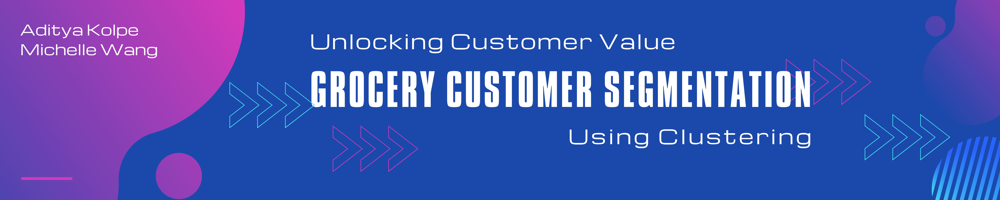Aditya Kolpe, Michelle Wang


## Link to Presentation video: https://youtu.be/JHHWHvbjNTQ


# Problem Domain
**Customer analytics** is very transferable for data analysts daily work in tech companies. We are interested in this project because it will help us understand how to uncover the intrinsic value within customer behaviour patterns.

Our interest as sparked by including industry trends, academic discussions, and previous personal experiences. There are some new trends of the evolution of customer behaviors covered in McKinsey's report [The state of grocery in North America 2023](https://www.mckinsey.com/industries/retail/our-insights/the-state-of-grocery-in-north-america-2023), GenZ consumers' preference is shifting to healthier eating and more value-driven purchases. Also, as [online shopping and more customized shopping experience](https://www.mckinsey.com/industries/retail/our-insights/the-next-horizon-for-grocery-ecommerce-beyond-the-pandemic-bump) are more and more prevailing, we would like to probe into these new surges.

About the methodology, lots of consulting companies do customer segmentation, such as [LEK's report](https://www.lek.com/industries/retail/services/consumer-segmentation) on their 3D approach: **(1) demographics and socioeconomic factors, (2) attitude and psychographics, and (3) customer mission.**

Our project will mainly focus on:
1. Starting with exploring and visualizing the basic pattern in data: What's the **distribution** of age, education, and other demographic features?
2. **Clustering**: How should we cluster the customers into different groups to have some targeted marketing campaigns?
3. **Distribution in each cluster**:What's the distribution of income or spending in each cluster?

We also cover Marketing campaigns and Customers Lifetime Value Analytics.


# Key Takeaways:
1. Increase in income → decreases the number of deals purchased

2. Existing marketing campaigns are effective only on high income and high expenditure customer segment

3. Customer Lifetime Value (CLV) increases with Income

4. Increase in complains → decreases the amount of products sold

5. Increase in income → decreases number of complains

# Dataset

his data is related to customer demographics, purchasing behavior, responses to promotions and channels of purchases. The attributes include:

- **Customer details**: Customer ID, Year of birth, education, marital status, income, number of kids at home, number of teenagers at home, Enrollment date with the company, recency (number of days since last purchase), IfComplained.

- **Products** (Amount spent on this particular good in the last two years): Wine, fruits, meat, fish, sweets, gold.

- **Promotion**: Number of purchases with discount, dummy variables mentioning if the customer accepted any offer in one of their campaigns.

- **Channels of purchase** (number of purchases using): Website, catalog, store and number of visits to the website.

All the data is stored in one table in 29 columns and 2240 rows.
The data is not clean or ready to be analysed. There are a few null values that need to be filled. There are multiple categorical data columns like education or marital status that needs to be converted to dummy values for analysis. Moreover, columns like income and others need to be scaled/standardised so that all the features have a balanced effect on the model.

This data refects customer purchasing patterns and allows us to analyse the sales trends of the company's products. For a new company entering the market, this data can be used to study consumer spending behavior so that products can be targetted to certain groups of similar people at a price they are willing to spend.

# Let's get started!

In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
import altair as alt

#Importing the Libraries
import datetime
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import colors

import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans

from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import AgglomerativeClustering
from matplotlib.colors import ListedColormap
from sklearn import metrics
import warnings
import sys
if not sys.warnoptions:
    warnings.simplefilter("ignore")
np.random.seed(42)

In [ ]:
data=pd.read_csv('/content/gdrive/MyDrive/DSBD_project1_Aditya_Michelle/marketing_campaign.csv', sep="\t", index_col=0)
#data = pd.read_csv("gdrive/MyDrive/Colab Notebooks/marketing_campaign.csv", sep='\t', index_col=0)
data.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
ID,,,,,,,,,,,,,,,,,,,,,
5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,...,7,0,0,0,0,0,0,3,11,1
2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,...,5,0,0,0,0,0,0,3,11,0
4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,...,4,0,0,0,0,0,0,3,11,0
6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,...,6,0,0,0,0,0,0,3,11,0
5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,...,5,0,0,0,0,0,0,3,11,0


# I. Data Cleaning

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2240 entries, 5524 to 9405
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Year_Birth           2240 non-null   int64  
 1   Education            2240 non-null   object 
 2   Marital_Status       2240 non-null   object 
 3   Income               2216 non-null   float64
 4   Kidhome              2240 non-null   int64  
 5   Teenhome             2240 non-null   int64  
 6   Dt_Customer          2240 non-null   object 
 7   Recency              2240 non-null   int64  
 8   MntWines             2240 non-null   int64  
 9   MntFruits            2240 non-null   int64  
 10  MntMeatProducts      2240 non-null   int64  
 11  MntFishProducts      2240 non-null   int64  
 12  MntSweetProducts     2240 non-null   int64  
 13  MntGoldProds         2240 non-null   int64  
 14  NumDealsPurchases    2240 non-null   int64  
 15  NumWebPurchases      2240 non-null 

## Findings:
1. Missing value: `Income` has 24 missing values
2. Time Series Data: `Dt_Customer`, which is the data of customer joined, should be DataTime form
3. Encoding Categorical Data: `AcceptedCmp1/2/3/4/5` is already encoded as dummy variables; while `Education` `Marital_Status` are still in object form, need to be further encoded.

### 1. Drop Missing Data
Because income is a important dimension of clustering, it's not feasible to impulate income with mean/mode. We directly drop them.

In [ ]:
data = data.dropna()

### 2. DateTime data

In [ ]:
data['Dt_Customer'] = pd.to_datetime(data['Dt_Customer'], format='%d-%m-%Y') ######format='%d-%m-%Y'
dates = []
for i in data['Dt_Customer']:
    dates.append(i.date())
print('time span:', min(dates), max(dates))

time span: 2012-07-30 2014-06-29


Creating `Duration_customer` to calculate how many days the customers have started shopping here

In [ ]:
# taking the max(dates) as the baseline (newest customer)
# duration of customer membership = max(dates)-i
data['duration_customer'] = [(max(dates)-i) for i in dates]
data['duration_customer'] = data['duration_customer'].dt.days

In [ ]:
# use 'Year_Birth' to create 'Age' column
data['Age'] = 2014 - data['Year_Birth'] #use 2014 because of the timespan of the records, max(year) is 2014
data.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,duration_customer,Age
ID,,,,,,,,,,,,,,,,,,,,,
5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,...,0,0,0,0,0,3,11,1,663,57
2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,...,0,0,0,0,0,3,11,0,113,60
4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,...,0,0,0,0,0,3,11,0,312,49
6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,...,0,0,0,0,0,3,11,0,139,30
5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,...,0,0,0,0,0,3,11,0,161,33


### 3. Categorical Data

 For Marital Status & Family

In [ ]:
data['Marital_Status'].value_counts()

Married     857
Together    573
Single      471
Divorced    232
Widow        76
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64

In [ ]:
# Merging some types of Marital_Status into partner/alone
data["Partner"] = data["Marital_Status"].replace({"Married": 1, "Together": 1, "Absurd": 0, "Widow": 0, "YOLO": 0, "Divorced": 0, "Single": 0, 'Alone':0}).astype('int64')

# calculate number of children = kid+teen
data["Children"]=data["Kidhome"]+data["Teenhome"]

# calculate family size = partner + children + 1(self)
data["Family_Size"] = data["Partner"]+ data["Children"] +1

# if children>0, is parent =1
data["Is_Parent"] = np.where(data.Children> 0, 1, 0)
data.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,Complain,Z_CostContact,Z_Revenue,Response,duration_customer,Age,Partner,Children,Family_Size,Is_Parent
ID,,,,,,,,,,,,,,,,,,,,,
5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,...,0,3,11,1,663,57,0,0,1,0
2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,...,0,3,11,0,113,60,0,2,3,1
4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,...,0,3,11,0,312,49,1,0,2,0
6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,...,0,3,11,0,139,30,1,1,3,1
5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,...,0,3,11,0,161,33,1,1,3,1


For Education

In [ ]:
data['Education'].value_counts()

Graduation    1116
PhD            481
Master         365
2n Cycle       200
Basic           54
Name: Education, dtype: int64

In [ ]:
# merge education levels in three groups
data["Education"]=data["Education"].replace({"Basic":"Undergraduate","2n Cycle":"Undergraduate", "Graduation":"Graduate", "Master":"Postgraduate", "PhD":"Postgraduate"})

For products types

In [ ]:
# change column names
data=data.rename(columns={"MntWines": "Wines","MntFruits":"Fruits","MntMeatProducts":"Meat","MntFishProducts":"Fish","MntSweetProducts":"Sweets","MntGoldProds":"Gold"})

# aggregating different types into total spent
data["Spent"] = data["Wines"]+ data["Fruits"]+ data["Meat"]+ data["Fish"]+ data["Sweets"]+ data["Gold"]

In [ ]:
# drop redundant
data = data.drop(["Marital_Status", "Dt_Customer", "Z_CostContact", "Z_Revenue", "Year_Birth"], axis=1)
data.head()

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,...,AcceptedCmp2,Complain,Response,duration_customer,Age,Partner,Children,Family_Size,Is_Parent,Spent
ID,,,,,,,,,,,,,,,,,,,,,
5524,Graduate,58138.0,0,0,58,635,88,546,172,88,...,0,0,1,663,57,0,0,1,0,1617
2174,Graduate,46344.0,1,1,38,11,1,6,2,1,...,0,0,0,113,60,0,2,3,1,27
4141,Graduate,71613.0,0,0,26,426,49,127,111,21,...,0,0,0,312,49,1,0,2,0,776
6182,Graduate,26646.0,1,0,26,11,4,20,10,3,...,0,0,0,139,30,1,1,3,1,53
5324,Postgraduate,58293.0,1,0,94,173,43,118,46,27,...,0,0,0,161,33,1,1,3,1,422


### 4. Dropping outliers

In [ ]:
data.describe()

,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,...,AcceptedCmp2,Complain,Response,duration_customer,Age,Partner,Children,Family_Size,Is_Parent,Spent
count,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,...,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000
mean,52247.251354,0.441787,0.505415,49.012635,305.091606,26.356047,166.995939,37.637635,27.028881,43.965253,...,0.013538,0.009477,0.150271,353.521209,45.179603,0.645307,0.947202,2.592509,0.714350,607.075361
std,25173.076661,0.536896,0.544181,28.948352,337.327920,39.793917,224.283273,54.752082,41.072046,51.815414,...,0.115588,0.096907,0.357417,202.434667,11.985554,0.478528,0.749062,0.905722,0.451825,602.900476
min,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,18.000000,0.000000,0.000000,1.000000,0.000000,5.000000
25%,35303.000000,0.000000,0.000000,24.000000,24.000000,2.000000,16.000000,3.000000,1.000000,9.000000,...,0.000000,0.000000,0.000000,180.000000,37.000000,0.000000,0.000000,2.000000,0.000000,69.000000
50%,51381.500000,0.000000,0.000000,49.000000,174.500000,8.000000,68.000000,12.000000,8.000000,24.500000,...,0.000000,0.000000,0.000000,355.500000,44.000000,1.000000,1.000000,3.000000,1.000000,396.500000
75%,68522.000000,1.000000,1.000000,74.000000,505.000000,33.000000,232.250000,50.000000,33.000000,56.000000,...,0.000000,0.000000,0.000000,529.000000,55.000000,1.000000,1.000000,3.000000,1.000000,1048.000000
max,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,262.000000,321.000000,...,1.000000,1.000000,1.000000,699.000000,121.000000,1.000000,3.000000,5.000000,1.000000,2525.000000


Use pairplots from Seaborn to detect patterns and outliers

Reletive Plot Of Some Selected Features: A Data Subset


<Figure size 640x480 with 0 Axes>

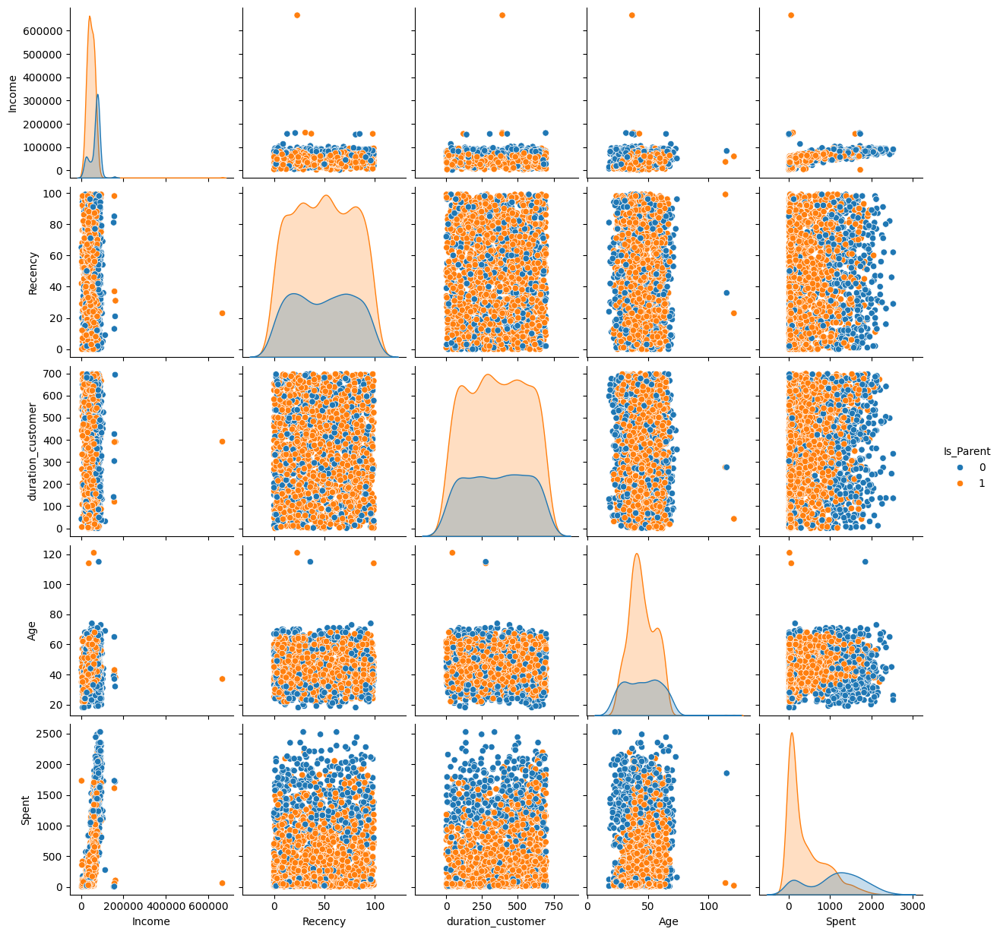

In [ ]:
To_Plot = [ "Income", "Recency", "duration_customer", "Age", "Spent", "Is_Parent"]
print("Reletive Plot Of Some Selected Features: A Data Subset")
plt.figure()
sns.pairplot(data[To_Plot], hue= "Is_Parent")
#Taking hue
plt.show()

Outliers:
1. Someone has an age of 121, incredible!
2. Some income are too high, which may not be the target customers

`explain why drop data` !!!!

In [ ]:
# abandon ourliers
data = data[(data["Age"]<90)]
data = data[(data["Income"]<600000)]

### 5. Encoding `Education`

In [ ]:
s = (data.dtypes == 'object')
object_cols = list(s[s].index)
object_cols

['Education']

In [ ]:
## Label encoder
LE=LabelEncoder()
for i in object_cols:
    data[i]=data[[i]].apply(LE.fit_transform)

# II. Use Altair to visualize

### 0. Income vs Meat Purchase by Parental Status


In [ ]:
scatter_plot = alt.Chart(data).mark_circle().encode(
    x='Income',
    y='Meat',
    color=alt.Color('Is_Parent:N', scale=alt.Scale(scheme='tableau10')),  # Using a different color scheme
    tooltip=['Income', 'Meat', 'Is_Parent']).properties(title='Income vs Meat Purchase by Parental Status')

scatter_plot

alt.Chart(...)

There's clear difference in meat-consumption across different income-is_parent groups, it's worthwhile for us to probe into the relationship

### 1. Income vs Recency by Parental Status

In [ ]:
scatter_plot = alt.Chart(data).mark_circle().encode(
    x='Income',
    y='Recency',
    color=alt.Color('Is_Parent:N', scale=alt.Scale(scheme='tableau10')),  # Using a different color scheme
    tooltip=['Income', 'Recency', 'Is_Parent']
).properties(title='Income vs Recency by Parental Status')

scatter_plot

alt.Chart(...)

It shows there's small difference in recency across different income-is_parent groups

### 2. Income vs Spent by Parental Status

In [ ]:
scatter_plot = alt.Chart(data).mark_circle().encode(
    x='Income',
    y='Spent',
    color=alt.Color('Is_Parent:N', scale=alt.Scale(scheme='tableau10')),  # Using a different color scheme
    tooltip=['Income', 'Spent', 'Is_Parent']
).properties(title='Income vs Spent by Parental Status')

scatter_plot

alt.Chart(...)

There's clear difference in Spent across different income-is_parent groups, it's worthwhile for us to probe into the relationship

### 3. Corr Matrix

<Axes: >

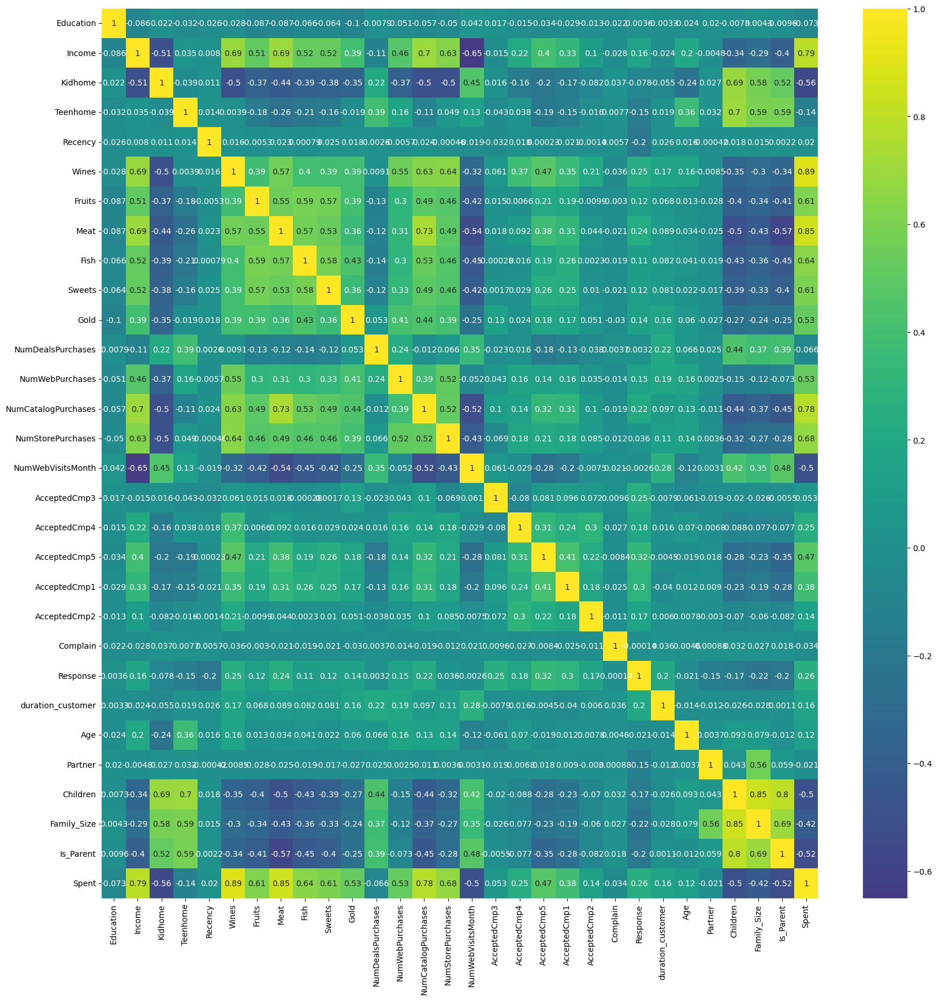

In [ ]:
corrmat= data.corr()
plt.figure(figsize=(20,20))
sns.heatmap(corrmat,annot=True, cmap='viridis', center=0)

Using Altair to draw the above heatmap:

In [ ]:
corr_data = data.corr().stack().reset_index(name='correlation')
corr_data['correlation_label'] = corr_data['correlation'].map('{:.2f}'.format)

# base chart (colored heatmap cells)
base = alt.Chart(corr_data).encode(
    x=alt.X('level_0:O', title=None),
    y=alt.Y('level_1:O', title=None))

# rectangles heatmap
rects = base.mark_rect().encode(
    color=alt.Color('correlation:Q', scale=alt.Scale(domain=[-1, 1], scheme='redblue'))).properties(
    width=800,height=800)

# Text labels - Pearson coefficients
# set font size = 8
text = base.mark_text(baseline='middle',size=8).encode(
    text='correlation_label:O',
    color=alt.condition("datum.correlation > 0.5 | datum.correlation < -0.5",
        alt.value('white'),alt.value('black')))

# combine
chart = rects + text
chart.display()

alt.LayerChart(...)

We can use the heatmap to detect some corrlated variables, can be used to get rid of multi-collinearity in further analysis

### 4. Customer's Age Distribution

In [ ]:
from scipy.stats import gaussian_kde

# density estimation for Age
age_values = data['Age']
density = gaussian_kde(age_values, bw_method=0.3)
ages = np.linspace(age_values.min(), age_values.max(), 1000)
density_values = density(ages) * len(age_values) * (ages[1] - ages[0])  # Scale to match the histogram

# histogram
histogram = alt.Chart(data).mark_bar().encode(
    alt.X('Age', bin=alt.Bin(maxbins=40), title='Age'),
    alt.Y('count()', title='Count'),
    color=alt.value('steelblue')
).properties(
    title="Customer's Age Distribution")

# density plot line
density_plot = alt.Chart(pd.DataFrame({'Age': ages, 'Density': density_values})).mark_line().encode(
    x='Age',
    y=alt.Y('Density:Q', axis=alt.Axis(title='Density')),
    color=alt.value('orange'))

# Combine the histogram and density plot
final_plot = alt.layer(histogram, density_plot).resolve_scale(
    y='independent')

final_plot = final_plot.configure_range(
    category={'scheme': 'viridis'})

final_plot.display()

alt.LayerChart(...)

### 5. Education Level-wise Income Distribution

In [ ]:
# KDE on Income to get density values
income_values = data['Income']
density = gaussian_kde(income_values, bw_method=0.3)
incomes = np.linspace(income_values.min(), income_values.max(), 1000)
density_values = density(incomes) * len(income_values) * np.diff(incomes[:2])

# dataframe for density plot
density_df = pd.DataFrame({'Income': incomes, 'Density': density_values})

# stacked bar chart for Income by Education
stacked_bar = alt.Chart(data).mark_bar().encode(
    alt.X('Income:Q', bin=alt.Bin(maxbins=40), title='Income'),
    alt.Y('count()', stack='zero', title='Count'),
    color=alt.Color('Education:N', scale=alt.Scale(scheme='viridis'))
).properties(
    title="Education Level-wise Income Distribution"
)

# density plot line
density_plot = alt.Chart(density_df).mark_line().encode(
    x='Income:Q',
    y=alt.Y('Density:Q', axis=alt.Axis(title='Density')),
    color=alt.value('orange')  # This can be set to a specific color or a color from a scheme
)

# combine 2 plots
combined_chart = alt.layer(stacked_bar, density_plot).resolve_scale(y='independent')
combined_chart.display()

alt.LayerChart(...)

Education: 0,1,2 - undergraduate, graduate, postgraduate
- We need further revise the graph to show the labels

# III. PCA: dimension reduction

Since the variables are too many for us to do the cluster, and some of the features are correlated that can cause the problem of multicollinearity, we need to reduce the dimension of the data before clustering.
We choose Principal component analysis (PCA) to reduce features, considering the dataset's charateristics and minimizing information loss.

In [ ]:
data.describe()

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,...,AcceptedCmp2,Complain,Response,duration_customer,Age,Partner,Children,Family_Size,Is_Parent,Spent
count,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,...,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000,2212.000000
mean,0.609855,51958.810579,0.441682,0.505877,49.019439,305.287523,26.329566,167.029837,37.648734,27.046564,...,0.013562,0.009042,0.150542,353.714286,45.086347,0.645570,0.947559,2.593128,0.714286,607.268083
std,0.682635,21527.278844,0.536955,0.544253,28.943121,337.322940,39.744052,224.254493,54.772033,41.090991,...,0.115691,0.094678,0.357683,202.494886,11.701599,0.478449,0.749466,0.906236,0.451856,602.513364
min,0.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,18.000000,0.000000,0.000000,1.000000,0.000000,5.000000
25%,0.000000,35233.500000,0.000000,0.000000,24.000000,24.000000,2.000000,16.000000,3.000000,1.000000,...,0.000000,0.000000,0.000000,180.000000,37.000000,0.000000,0.000000,2.000000,0.000000,69.000000
50%,0.000000,51371.000000,0.000000,0.000000,49.000000,175.500000,8.000000,68.000000,12.000000,8.000000,...,0.000000,0.000000,0.000000,356.000000,44.000000,1.000000,1.000000,3.000000,1.000000,397.000000
75%,1.000000,68487.000000,1.000000,1.000000,74.000000,505.000000,33.000000,232.250000,50.000000,33.000000,...,0.000000,0.000000,0.000000,529.000000,55.000000,1.000000,1.000000,3.000000,1.000000,1048.000000
max,2.000000,162397.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,262.000000,...,1.000000,1.000000,1.000000,699.000000,74.000000,1.000000,3.000000,5.000000,1.000000,2525.000000


### 1. Scale the data
We don't need to scale `AcceptedCmp1/2/3/4/5` and `Complain`/`Response`, because they are dummy variables.

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
features = ['Education', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'Wines',
            'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold', 'NumDealsPurchases',
            'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
            'NumWebVisitsMonth', 'duration_customer',
            'Age', 'Partner', 'Children', 'Family_Size', 'Is_Parent', 'Spent']
scaled_data = scaler.fit_transform(data[features])
scaled_data_df = pd.DataFrame(scaled_data, columns=features)
scaled_data_df.head()

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,duration_customer,Age,Partner,Children,Family_Size,Is_Parent,Spent
0,-0.893586,0.287105,-0.822754,-0.929699,0.310353,0.977660,1.552041,1.690293,2.453472,1.483713,...,2.503607,-0.555814,0.692181,1.527721,1.018352,-1.349603,-1.264598,-1.758359,-1.581139,1.676245
1,-0.893586,-0.260882,1.040021,0.908097,-0.380813,-0.872618,-0.637461,-0.718230,-0.651004,-0.634019,...,-0.571340,-1.171160,-0.132545,-1.189011,1.274785,-1.349603,1.404572,0.449070,0.632456,-0.963297
2,-0.893586,0.913196,-0.822754,-0.929699,-0.795514,0.357935,0.570540,-0.178542,1.339513,-0.147184,...,-0.229679,1.290224,-0.544908,-0.206048,0.334530,0.740959,-1.264598,-0.654644,-1.581139,0.280110
3,-0.893586,-1.176114,1.040021,-0.929699,-0.795514,-0.872618,-0.561961,-0.655787,-0.504911,-0.585335,...,-0.913000,-0.555814,0.279818,-1.060584,-1.289547,0.740959,0.069987,0.449070,0.632456,-0.920135
4,0.571657,0.294307,1.040021,-0.929699,1.554453,-0.392257,0.419540,-0.218684,0.152508,-0.001133,...,0.111982,0.059532,-0.132545,-0.951915,-1.033114,0.740959,0.069987,0.449070,0.632456,-0.307562


### 2. PCA

In [ ]:
# PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
PCA_data = pd.DataFrame(pca.fit_transform(scaled_data), columns=["PC1", "PC2", "PC3"])

# Describing the PCA results
PCA_data.describe().T

,count,mean,std,min,25%,50%,75%,max
PC1,2212.0,6.424437e-18,2.878602,-5.978127,-2.539471,-0.781596,2.386383,7.452916
PC2,2212.0,1.284887e-17,1.709469,-4.194862,-1.323994,-0.173746,1.235311,6.168113
PC3,2212.0,5.541077e-17,1.231685,-3.624430,-0.854002,-0.051345,0.861924,6.743668


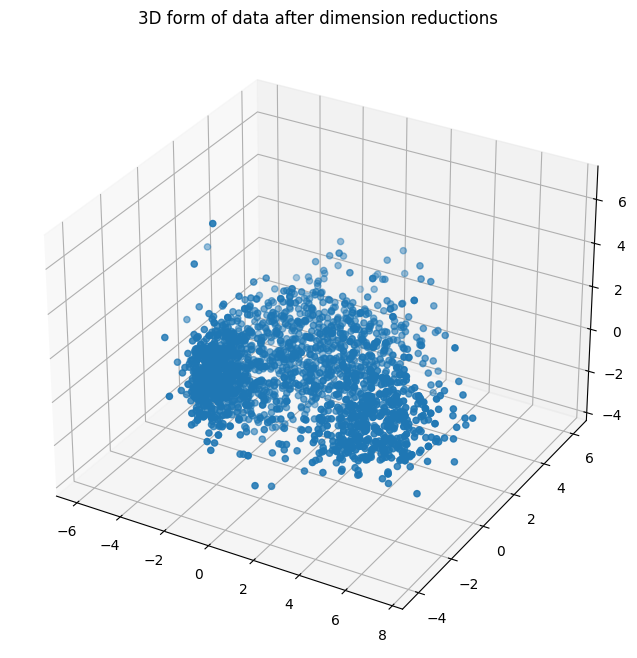

In [ ]:
x =PCA_data["PC1"]
y =PCA_data["PC2"]
z =PCA_data["PC3"]
#To plot
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, marker="o" )
ax.set_title("3D form of data after dimension reductions")
plt.show()

In [ ]:
# interactive version of above 3D graph
import plotly.graph_objects as go
fig = go.Figure(data = [go.Scatter3d(x=x, y=y, z=z,mode='markers',
                marker = dict(size=10, opacity=0.8))])
fig.update_layout(title=dict(text= "3D, After Diemsionality Reduction",
                             y=0.97,x=0.5,xanchor= "center",yanchor= "top",font_color="black"),
                  scene=dict(xaxis = dict(title="col1",showbackground=True,showgrid=True, gridwidth=2, ),
                             yaxis = dict(title="col2",showbackground=True,showgrid=True, gridwidth=2),
                             zaxis = dict(title="col3",showbackground=True,showgrid=True, gridwidth=2)),
                  margin=dict(l=0, r=0, b=0, t=0))
fig.show()


In [ ]:
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)

# IV. Clustering and Visualization

## 1. Number of clusters
Determining how many clusters need to be formed using the Elbow method and vizualising using Altair

In [ ]:
wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, n_init=10)  # set n_init=10 to prevent 'future warning'
    kmeans.fit(PCA_data[['PC1', 'PC2', 'PC3']])
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
elbow_df = pd.DataFrame({'k': range(1, 11), 'WCSS': wcss})
elbow_chart = alt.Chart(elbow_df).mark_line().encode(
    x='k',
    y='WCSS'
).properties(
    title='Elbow Method for Optimal k',
    width=400,
    height=300
)

elbow_chart

alt.Chart(...)

## 2. Use K-means for clustering

In [ ]:
kmeans = KMeans(n_clusters=4,n_init=10,random_state = 11)
PCA_data['cluster'] = kmeans.fit_predict(PCA_data[['PC1', 'PC2', 'PC3']])

# Convert cluster column to categorical for visualization
PCA_data['cluster'] = PCA_data['cluster'].astype(str)

# Plot using Altair
scatter_plot = alt.Chart(PCA_data).mark_point().encode(
    x='PC1',
    y='PC2',
    color='cluster:N',  # Color points by cluster
    tooltip=['PC1', 'PC2', 'PC3', 'cluster']  # Display PC1, PC2, PC3, and cluster label on hover
).properties(
    width=800,
    height=500
).interactive()

scatter_plot

alt.Chart(...)

## 3. Vizualising the clustering in 3D
Use 3D since we have 3 parameters PCA1, PCA2 and PCA3

In [ ]:
import plotly.graph_objects as go
from sklearn.cluster import KMeans

PCA_data['cluster'] = kmeans.fit_predict(PCA_data[['PC1', 'PC2', 'PC3']])

# Create 3D scatter plot using Plotly
fig = go.Figure(data=go.Scatter3d(
    x=PCA_data['PC1'],
    y=PCA_data['PC2'],
    z=PCA_data['PC3'],
    mode='markers',
    marker=dict(
        color=PCA_data['cluster'],
        colorscale='Viridis',
        size=5
    )))

fig.update_layout(
    title='3D Scatter Plot of Clustered Data',
    scene=dict(
        xaxis=dict(title='PC1'),
        yaxis=dict(title='PC2'),
        zaxis=dict(title='PC3')
    ))

fig.show()


Lets check the distribution of the clusters

In [ ]:
cluster_counts = PCA_data['cluster'].value_counts().reset_index()
cluster_counts.columns = ['cluster', 'count']

# Plot the countplot using Altair
countplot = alt.Chart(cluster_counts).mark_bar().encode(
    x='cluster:O',
    y='count:Q',
    color=alt.value('steelblue')
).properties(
    title='Countplot of Clusters',
    width=400,
    height=300
)

countplot

alt.Chart(...)

The clusters seem to be fairly distributed

In [ ]:
df = pd.concat([scaled_data_df, PCA_data['cluster']], axis=1)


## 4. Income vs Expenditure according to different clusters

In [ ]:
scatterplot = alt.Chart(df).mark_circle().encode(
    x='Income',
    y='Spent',
    color=alt.Color('cluster:N', scale=alt.Scale(scheme='category10')),
    tooltip=['Income', 'Spent', 'cluster']
).properties(
    title='Income vs Spent with Clusters',
    width=600,
    height=400
).interactive()

scatterplot

alt.Chart(...)

CLuster 0 (blue): high income and high expenditure

Cluster 2 (green): medium income and medium expenditure

Cluster 3 (red): medium income and low expenditure

Cluster 1 (orange): low income and low expenditure

In [ ]:
avg_deals_purchases = df.groupby('cluster')['NumDealsPurchases'].mean().reset_index()

# Plot the bar chart using Altair
bar_chart = alt.Chart(avg_deals_purchases).mark_bar().encode(
    x='cluster:O',
    y='NumDealsPurchases:Q',
    tooltip=['cluster', 'NumDealsPurchases']
).properties(
    title='Average NumDealsPurchases by Cluster',
    width=400,
    height=300
)

bar_chart

alt.Chart(...)

## 5. Hypothesis & Analysis
Let's consider a hypothesis that **as increase in income decreases the number of deals purchased.**

Let's plot a scatter plot to see how people from different clusters are spending on deals.

In [ ]:
scatter_plot = alt.Chart(df).mark_circle().encode(
    x='Income:Q',
    y='NumDealsPurchases:Q',
    color=alt.Color('cluster:N', scale=alt.Scale(scheme='category10')),
    tooltip=['Income', 'NumDealsPurchases']
).properties(
    title='Correlation between Income and Number of Deals Purchases',
    width=600,
    height=400
)

scatter_plot

alt.Chart(...)

We observe that the blue cluster (high income and high expenditure) are not buying many deals (as most of the orange dots on the bottom right of the graph).

Most of the deals are purchased by people from green (medium income and medium expenditure) and red cluster (medium income and low expenditure).

Yellow cluster (low income and low expenditure) mostly do not buy many deals on average. Probably because they do not want to spend despite of the deals due to lower income.

Let's try to fit a line to observe the trend with respect to income

In [ ]:
trend_line = scatter_plot.transform_regression('Income', 'NumDealsPurchases').mark_line(color='black')

scatter_plot + trend_line

alt.LayerChart(...)

Thus, we observe that as income increases, the number of deals purchased decreases.

# V. After intermediate check in, our plan:
1. By looking into each campaign's data, find what are the target customers for each different marketing campaign --> part VII - X
2. Exploring marginal chart with Altair: https://altair-viz.github.io/gallery/scatter_marginal_hist.html --> part VI
3. We'll try using `YellowBricks` library to visualize our clustering results. It's a library designed for visualizing machine learning results and evaluation metrics. --> part VI


# VI. **Visualizing** Cluster Results with `YellowBrick`

### 1. Distortion Score Elbow for KMeans Clustering:

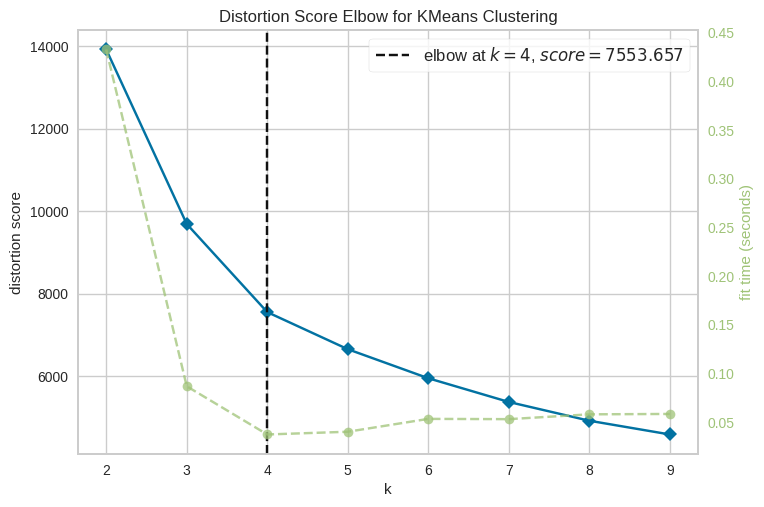

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer, InterclusterDistance

# KElbowVisualizer to find the optimal number of clusters
model_kmeans = KMeans(n_init=10,random_state = 11)
elbow_visualizer = KElbowVisualizer(model_kmeans, k=(2,10))
elbow_visualizer.fit(PCA_data[['PC1', 'PC2', 'PC3']])    # Fit the data to the visualizer
elbow_visualizer.show()

This plot shows the distortion score for different numbers of clusters (k) using YellowBricks, which has more features than the Elbow chart we used in former parts.

- The distortion score: measures the sum of the squared distances between each point and the centroid of its assigned cluster. It can help us to assess the quality of clustering. ---> We look for an "elbow" where the rate of decrease sharply changes, indicating a diminishing return in the improvement of the score.
- Conclusion: `k=4` - marked by the dashed line. Beyond 4 clusters, the improvement in the distortion score is small

### 2. Silhouette Plot of KMeans Clustering
4 centers:

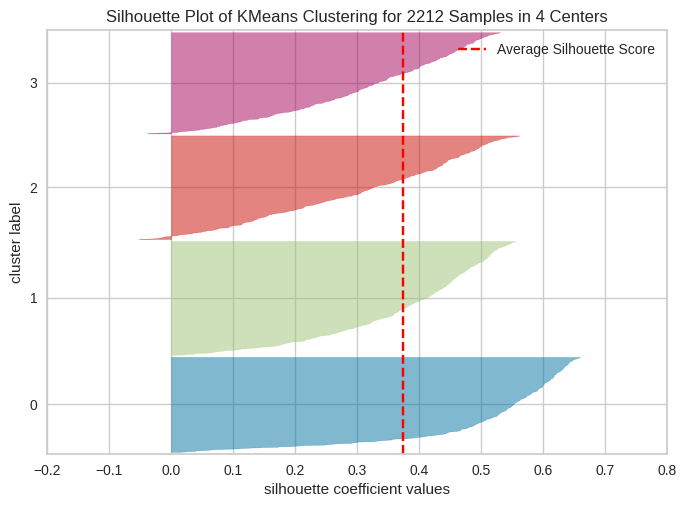

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 2212 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
# SilhouetteVisualizer to evaluate the quality of clusters
silhouette_visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
silhouette_visualizer.fit(PCA_data[['PC1', 'PC2', 'PC3']])    # Fit the data to the visualizer
silhouette_visualizer.show()

9 centers:

We used 9 centers here only for visualization of the data to see how it would be if we have up to 9 clusters. However, in the former part, we used k=4 which is the best number of clusters.

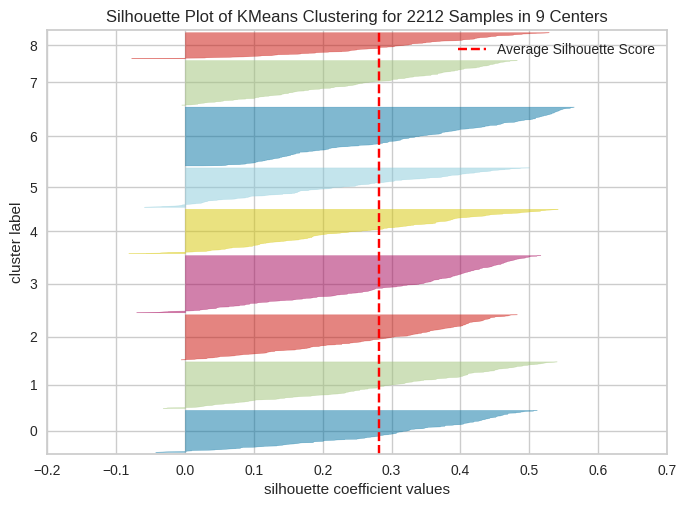

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 2212 Samples in 9 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [ ]:
kmeans_9 = KMeans(n_clusters=9,n_init=10,random_state = 11)
silhouette_visualizer = SilhouetteVisualizer(kmeans_9, colors='yellowbrick')
silhouette_visualizer.fit(PCA_data[['PC1', 'PC2', 'PC3']])    # Fit the data to the visualizer
silhouette_visualizer.show()

This silhouette plot shows how close each point in a cluster is to points in the neighboring clusters.
The `silhouette coefficient` is a measure of how similar an object is to its own cluster compared to other clusters. The values range from -1 to 1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters.
- Red dashed line: the average silhouette score across all samples. Clusters with silhouette coefficients that extend beyond the average are generally considered to be well separated.
- Varying silhouette widths: suggesting some clusters are more cohesive and separated than others.

### 3. KMeans Intercluster Distance Map (via MDS)

4 centers:

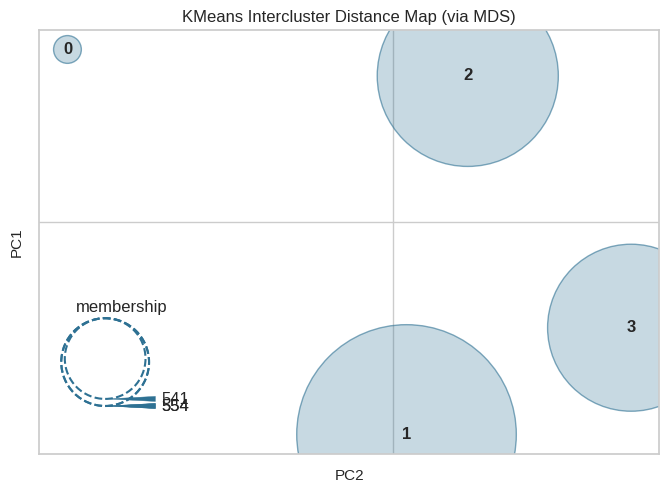

<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [ ]:
# InterclusterDistance to view the distance between different clusters
distance_visualizer = InterclusterDistance(kmeans)
distance_visualizer.fit(PCA_data[['PC1', 'PC2', 'PC3']])    # Fit the data to the visualizer
distance_visualizer.show()

9 centers:

Same as above, we used 9 centers here only for visualization of the data to see how it would be if we have up to 9 clusters.

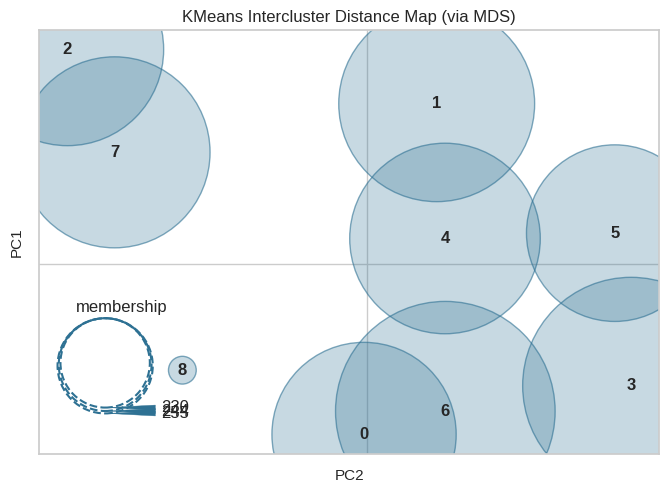

<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [ ]:
distance_visualizer = InterclusterDistance(kmeans_9)
distance_visualizer.fit(PCA_data[['PC1', 'PC2', 'PC3']])    # Fit the data to the visualizer
distance_visualizer.show()

It uses multidimensional scaling (MDS) to place clusters on a 2D plane so that the distances between points on the plane can somewhat reflect the distances between clusters in the high-dimensional space.

- Size: Larger circles represent a larger number of members in a cluster.
- Overlapping circles: indicate clusters that are not well separated in the high-dimensional space. There are several overlap indicating that the clusters are not very distinct from each other in the dataset's multidimensional space.

## Marginal Chart Using Altair

In [ ]:
scatter = alt.Chart(PCA_data).mark_circle().encode(
    alt.X('PC1:Q', title='PC1'),
    alt.Y('PC2:Q', title='PC2'),
    color='cluster:N')

# Top histogram
top_hist = alt.Chart(PCA_data).mark_bar().encode(
    alt.X('PC1:Q', bin=True),
    alt.Y('count()', title=''),
    color='cluster:N').properties(height=60)

# Right histogram
right_hist = alt.Chart(PCA_data).mark_bar().encode(
    alt.Y('PC2:Q', bin=True),
    alt.X('count()', title=''),
    color='cluster:N').properties(width=60)

# Combined chart
chart = alt.vconcat(top_hist,
    alt.hconcat(scatter,
        right_hist,
        spacing=5).resolve_scale(y='independent'),
    spacing=5)

chart

alt.VConcatChart(...)

In [ ]:
# Base chart for scatter plot
cluster_df = data[features].copy().reset_index()
cluster_df = pd.concat([cluster_df, PCA_data['cluster']], axis=1)
scatter = alt.Chart(cluster_df).mark_circle(size=60).encode(
    x=alt.X('Income', title='Annual Income'),
    y=alt.Y('Spent', title='Total Spent'),
    color=alt.Color('cluster:N', scale=alt.Scale(scheme='category10')),
    tooltip=['Income', 'Spent']
).properties(
    title='Income vs Spent Scatter Plot',
    width=400,
    height=400
)


# Top histogram (marginal)
top_hist = alt.Chart(cluster_df).mark_bar().encode(
    alt.X('Income', bin=alt.Bin(maxbins=50), title=''),
    alt.Y('count()', title=''),
    color=alt.Color('cluster:N', scale=alt.Scale(scheme='category10')),
    opacity=alt.value(0.5)
).properties(width=400, height=100)

# Right histogram (marginal)
right_hist = alt.Chart(cluster_df).mark_bar().encode(
    alt.Y('Spent', bin=alt.Bin(maxbins=50), title=''),
    alt.X('count()', title=''),
    color=alt.Color('cluster:N', scale=alt.Scale(scheme='category10')),
    opacity=alt.value(0.5)
).properties(width=100, height=400)

# Combine charts for marginal plot
marginal_plot = alt.vconcat(
    top_hist,  # Top histogram
    alt.hconcat(
        scatter,  # Scatter plot
        right_hist,  # Right histogram
        spacing=10
    ),
    spacing=10
).resolve_scale(
    color='independent'
)

marginal_plot

alt.VConcatChart(...)

# VII. Customer Lifetime Value

**Customer Lifetime Value** (CLV) can be calculated using:

Calculate Average Purchase Value (APV): Find the average amount a customer spends per purchase. This can be calculated by dividing the total revenue generated from all purchases by the total number of purchases.

**APV** = Total Revenue / Total Number of Purchases

Calculate Average Purchase Frequency (APF): Determine how often, on average, customers make purchases within a given period (e.g., month, year). This can be calculated by dividing the total number of purchases by the total number of unique customers.

**APF** = Total Number of Purchases / Total Number of Unique Customers

Calculate Customer Lifetime: Estimate the average number of years a customer continues to purchase from your company. This can be determined based on historical data or industry benchmarks.

Calculate Customer Lifetime Value (CLV): Once you have APV, APF, and the estimated customer lifetime, you can calculate CLV using the formula:

**CLV** = APV * APF * Customer Lifetime

Let's consider a **hypothesis that CLV increases with an increase in income.**

To verify this, we will need to calculate CLV and plot it against income

In [ ]:
# Creating a new dataframe to store CLV_data

CLV_df = data[features].copy().reset_index()
CLV_df = pd.concat([CLV_df, PCA_data['cluster']], axis=1)
CLV_df

,ID,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,...,NumStorePurchases,NumWebVisitsMonth,duration_customer,Age,Partner,Children,Family_Size,Is_Parent,Spent,cluster
0,5524,0,58138.0,0,0,58,635,88,546,172,...,4,7,663,57,0,0,1,0,1617,0
1,2174,0,46344.0,1,1,38,11,1,6,2,...,2,5,113,60,0,2,3,1,27,3
2,4141,0,71613.0,0,0,26,426,49,127,111,...,10,4,312,49,1,0,2,0,776,0
3,6182,0,26646.0,1,0,26,11,4,20,10,...,4,6,139,30,1,1,3,1,53,1
4,5324,1,58293.0,1,0,94,173,43,118,46,...,6,5,161,33,1,1,3,1,422,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2207,10870,0,61223.0,0,1,46,709,43,182,42,...,4,5,381,47,1,1,3,1,1341,2
2208,4001,1,64014.0,2,1,56,406,0,30,0,...,5,7,19,68,1,3,5,1,444,3
2209,7270,0,56981.0,0,0,91,908,48,217,32,...,13,6,155,33,0,0,1,0,1241,0
2210,8235,1,69245.0,0,1,8,428,30,214,80,...,10,3,156,58,1,1,3,1,843,2


In [ ]:
# Calculate total revenue for each customer
CLV_df['Total_Revenue'] = CLV_df['Wines'] + CLV_df['Fruits'] + CLV_df['Meat'] + CLV_df['Fish'] + CLV_df['Sweets'] + CLV_df['Gold']

# Calculate total purchases for each customer
CLV_df['Total_Purchases'] = CLV_df['NumDealsPurchases'] + CLV_df['NumWebPurchases'] + CLV_df['NumCatalogPurchases'] + CLV_df['NumStorePurchases']

# Calculate Average Purchase Value (APV) for each customer
CLV_df['APV'] = CLV_df['Total_Revenue'] / CLV_df['Total_Purchases']

print(CLV_df[['Total_Revenue', 'Total_Purchases', 'APV']])

      Total_Revenue  Total_Purchases        APV
0              1617               25  64.680000
1                27                6   4.500000
2               776               21  36.952381
3                53                8   6.625000
4               422               19  22.210526
...             ...              ...        ...
2207           1341               18  74.500000
2208            444               22  20.181818
2209           1241               19  65.315789
2210            843               23  36.652174
2211            172               11  15.636364

[2212 rows x 3 columns]


In [ ]:
# Grand total of purchases from all the customers
total_purchases = CLV_df['NumDealsPurchases'].sum() + CLV_df['NumWebPurchases'].sum() + CLV_df['NumCatalogPurchases'].sum() + CLV_df['NumStorePurchases'].sum()

# Calculate number of unique customers
num_customers = CLV_df.index.nunique()

# Calculate average number of purchases per customer
avg_pur_freq = total_purchases / num_customers
avg_pur_freq

14.891500904159132

In [ ]:
# Average customer lifespan

avg_cust_lifespan = CLV_df['duration_customer'].mean()
avg_cust_lifespan

353.7142857142857

In [ ]:
# Calculating CLV

CLV_df['CLV'] = CLV_df['APV'] * avg_pur_freq * avg_cust_lifespan
CLV_df['CLV']

0       340691.331646
1        23703.014725
2       194640.628852
3        34896.105012
4       116990.318291
            ...      
2207    392416.577112
2208    106304.429675
2209    344040.248814
2210    193059.337324
2211     82361.990559
Name: CLV, Length: 2212, dtype: float64

In [ ]:
CLV_scatter_plot = alt.Chart(CLV_df).mark_circle().encode(
    x='Income',
    y='CLV',
    color=alt.Color('cluster:N', scale=alt.Scale(scheme='category10')),
    tooltip=['Income', 'CLV']
).properties(
    width=600,
    height=400,
    title='CLV vs Income'
)

CLV_scatter_plot

alt.Chart(...)

We observe that the blue cluster (high income and high expenditure) have the highest CLV, as we expected.

Green cluster (medium income and medium expenditure) have a lower CLV than orange cluster.

Red cluster (medium income and low expenditure) have a even lower CLV than red cluster as their income and expenditure is a bit lesser than red cluster.

Yellow cluster (low income and low expenditure) have the lowest CLV out of all the clusters.

Let's try to fit a line to observe the trend between CLV and income

In [ ]:
trend_line = CLV_scatter_plot.transform_regression('Income', 'CLV').mark_line(color='black')

CLV_scatter_plot + trend_line

alt.LayerChart(...)

As we expected, **CLV increases with an increase in income**

# VIII. Analysis of marketing campaigns on customer segments

To answer questions like which marketing campaigns are effective in which customer segments, let's create some new variables which will help us in determining how the customers in different segments have responded to the existing campaigns

In [ ]:
camp_features = ['Education', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'Wines',
            'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold', 'NumDealsPurchases',
            'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
            'NumWebVisitsMonth', 'duration_customer', 'AcceptedCmp1', 'AcceptedCmp2',
            'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
            'Age', 'Partner', 'Children', 'Family_Size', 'Is_Parent', 'Spent']
campaign_df = data[camp_features].copy().reset_index()
campaign_df = pd.concat([campaign_df, PCA_data['cluster']], axis=1)
campaign_df

,ID,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,Age,Partner,Children,Family_Size,Is_Parent,Spent,cluster
0,5524,0,58138.0,0,0,58,635,88,546,172,...,0,0,0,57,0,0,1,0,1617,0
1,2174,0,46344.0,1,1,38,11,1,6,2,...,0,0,0,60,0,2,3,1,27,3
2,4141,0,71613.0,0,0,26,426,49,127,111,...,0,0,0,49,1,0,2,0,776,0
3,6182,0,26646.0,1,0,26,11,4,20,10,...,0,0,0,30,1,1,3,1,53,1
4,5324,1,58293.0,1,0,94,173,43,118,46,...,0,0,0,33,1,1,3,1,422,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2207,10870,0,61223.0,0,1,46,709,43,182,42,...,0,0,0,47,1,1,3,1,1341,2
2208,4001,1,64014.0,2,1,56,406,0,30,0,...,0,0,0,68,1,3,5,1,444,3
2209,7270,0,56981.0,0,0,91,908,48,217,32,...,0,1,0,33,0,0,1,0,1241,0
2210,8235,1,69245.0,0,1,8,428,30,214,80,...,0,0,0,58,1,1,3,1,843,2


In [ ]:
campaign_df = campaign_df.rename(columns={
    'AcceptedCmp1': 'Accepted_campaign_1',
    'AcceptedCmp2': 'Accepted_campaign_2',
    'AcceptedCmp3': 'Accepted_campaign_3',
    'AcceptedCmp4': 'Accepted_campaign_4',
    'AcceptedCmp5': 'Accepted_campaign_5'
})
sum_acceptd_camp = campaign_df.groupby('cluster')[['Accepted_campaign_1', 'Accepted_campaign_2', 'Accepted_campaign_3', 'Accepted_campaign_4', 'Accepted_campaign_5']].sum()
sum_acceptd_camp['No_response'] = campaign_df.groupby('cluster').apply(lambda x: (x[['Accepted_campaign_1', 'Accepted_campaign_2', 'Accepted_campaign_3', 'Accepted_campaign_4', 'Accepted_campaign_5']] == 0).all(axis=1).sum())
sum_acceptd_camp['Total'] = campaign_df.groupby('cluster').size()
sum_acceptd_camp

,Accepted_campaign_1,Accepted_campaign_2,Accepted_campaign_3,Accepted_campaign_4,Accepted_campaign_5,No_response,Total
cluster,,,,,,,
0,111,18,42,66,137,286,508
1,1,0,51,3,0,555,609
2,25,10,43,74,24,423,554
3,5,2,27,21,0,490,541


In [ ]:
sum_acceptd_camp = sum_acceptd_camp.reset_index()

# Melt the DataFrame to long format for easier visualization
sum_acceptd_camp_m = sum_acceptd_camp.melt(id_vars='cluster', var_name='Campaign', value_name='Number of people accepted')
sum_acceptd_camp_m

,cluster,Campaign,Number of people accepted
0,0,Accepted_campaign_1,111
1,1,Accepted_campaign_1,1
2,2,Accepted_campaign_1,25
3,3,Accepted_campaign_1,5
4,0,Accepted_campaign_2,18
5,1,Accepted_campaign_2,0
6,2,Accepted_campaign_2,10
7,3,Accepted_campaign_2,2
8,0,Accepted_campaign_3,42
9,1,Accepted_campaign_3,51


In [ ]:
accepted_cmp = sum_acceptd_camp_m[(sum_acceptd_camp_m['Campaign'] != 'No_response') & (sum_acceptd_camp_m['Campaign'] != 'Total')]
# Create the Altair bar chart
accepted_camp_by_cluster_hists = alt.Chart(accepted_cmp).mark_bar().encode(
    x='Campaign:N',
    y='Number of people accepted:Q',
    color='Campaign:N',
    column='cluster:N'
).properties(
    width=250,
    height=300
)

accepted_camp_by_cluster_hists

alt.Chart(...)

Cluster 3 (medium income and low expenditure): Most of the responses of people from cluster 3 were for campaign 3 and campaign 4.

Cluster 0 (high income and high expenditure): Most of the responses of people from cluster 0 were for campaign 5 and campaign 1.

Cluster 1 (low income and low expenditure): Most of the responses of people from cluster 1 were for campaign 3.

Cluster 2 (medium income and medium expenditure): We see a distributed responses from cluster 3 with maximum for campaign 4.

It may also be important to look at the number of people who did not respond to the campaigns from each cluster. Let's plot a chart for the same.

In [ ]:
no_response = sum_acceptd_camp_m[sum_acceptd_camp_m['Campaign'].isin(['No_response', 'Total'])].copy()
no_response.rename(columns={'Number of people accepted':'Number of people'}, inplace=True)

In [ ]:
no_response['Percentage'] = (no_response.loc[no_response['Campaign'] == 'No_response', 'Number of people'] /
                             no_response.loc[no_response['Campaign'] == 'Total', 'Number of people'].values) * 100

In [ ]:
# Create the bar chart
no_resp_bar_chart = alt.Chart(no_response[no_response['Campaign'] == 'No_response']).mark_bar().encode(
    x='cluster:N',
    y='Percentage:Q',
    color=alt.Color('cluster:N', scale=alt.Scale(scheme='category10')),
    tooltip=['cluster:N', 'Percentage:Q']
).properties(
    title='Percentage of Total People Who Did Not Respond per Cluster',
    width=400,
    height=300
)

no_resp_bar_chart

alt.Chart(...)

We observe that the existing campaigns are not very effective on clusters 1 and 3 as about 90% of the people in these clusters did not respond. Repurposing the resources and efforts to creating new campaigns for these clusters would be advised. Cluster 2 is somewhat responsive to the campaigns. Almost half of the people from cluster 0 are responsive to the campaigns (especially campaigns 5 and 1, as we saw above), so we can continue these campaigns for high income and high expenditure individuals. Similarly, we can also continue campaigns 4 and 3 for cluster 2 which is a group of people with medium expenditure and medium to high income groups.

We can conclude that people with low expenditure and lower income groups are not very responsive to the existing campaigns.

# IX. Increase in complaints decreases the number of products sold

In [ ]:
comp_features = ['Education', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'Wines',
            'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold', 'NumDealsPurchases',
            'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
            'NumWebVisitsMonth', 'duration_customer', 'Complain',
            'Age', 'Partner', 'Children', 'Family_Size', 'Is_Parent', 'Spent']
comp_df = data[comp_features].copy().reset_index()
comp_df = pd.concat([comp_df, PCA_data['cluster']], axis=1)
comp_df

,ID,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,...,NumWebVisitsMonth,duration_customer,Complain,Age,Partner,Children,Family_Size,Is_Parent,Spent,cluster
0,5524,0,58138.0,0,0,58,635,88,546,172,...,7,663,0,57,0,0,1,0,1617,0
1,2174,0,46344.0,1,1,38,11,1,6,2,...,5,113,0,60,0,2,3,1,27,3
2,4141,0,71613.0,0,0,26,426,49,127,111,...,4,312,0,49,1,0,2,0,776,0
3,6182,0,26646.0,1,0,26,11,4,20,10,...,6,139,0,30,1,1,3,1,53,1
4,5324,1,58293.0,1,0,94,173,43,118,46,...,5,161,0,33,1,1,3,1,422,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2207,10870,0,61223.0,0,1,46,709,43,182,42,...,5,381,0,47,1,1,3,1,1341,2
2208,4001,1,64014.0,2,1,56,406,0,30,0,...,7,19,0,68,1,3,5,1,444,3
2209,7270,0,56981.0,0,0,91,908,48,217,32,...,6,155,0,33,0,0,1,0,1241,0
2210,8235,1,69245.0,0,1,8,428,30,214,80,...,3,156,0,58,1,1,3,1,843,2


In [ ]:
# Select the columns of interest
features = ['Wines', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold',
            'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
            'NumStorePurchases', 'Complain']

# Group by 'Complain' and count the occurrences of each feature
feature_counts = comp_df[features].groupby('Complain').sum().reset_index()

# Melt the dataframe to make it suitable for visualization
feature_counts_melted = feature_counts.melt(id_vars='Complain', var_name='Feature', value_name='Count')

# Plot
bar_chart_feature_counts = alt.Chart(feature_counts_melted).mark_bar().encode(
    x='Feature:N',
    y='Count:Q',
    color='Complain:N',
    column='Complain:N',
    tooltip=['Complain', 'Feature', 'Count']
).properties(
    title='Counts of Features by Complaint Level',
    width=300,
    height=300
)

bar_chart_feature_counts


alt.Chart(...)

Notice that for features like Fish, Fruits, Gold, Meat, Sweets and Wines we have the sum of the amount spent by customers. Whereas for features like NumCatalogPurchases, NumDealsPurchases, etc we have the sum of the number of products bought by the customers and not the actual amount spent by them on it.

In [ ]:
complains_count = comp_df[comp_df['Complain'] == 1]['Complain'].sum()

complains_count

20

As the number of people who complained is very low (20 out of 2212), it is difficult to conclude whether complains reduce the number of products sold.

For rough estimation, we can scale down the sum of products sold by a factor of 110 (because 2212/20 ~ 110) for people who did not complain so that the number of products sold to customers who complained and the ones who did not complain are comparable. By doing so:

In [ ]:
feature_counts_melted.loc[feature_counts_melted['Complain'] == 0, 'Count'] /= 110

feature_counts_melted

,Complain,Feature,Count
0,0,Wines,6106.927273
1,1,Wines,3534.000000
2,0,Fruits,524.900000
3,1,Fruits,502.000000
4,0,Meat,3337.418182
5,1,Meat,2354.000000
6,0,Fish,752.227273
7,1,Fish,534.000000
8,0,Sweets,540.572727
9,1,Sweets,364.000000


In [ ]:
bar_chart_feature_counts = alt.Chart(feature_counts_melted).mark_bar().encode(
    x='Feature:N',
    y='Count:Q',
    color='Complain:N',
    column='Complain:N',
    tooltip=['Complain', 'Feature', 'Count']
).properties(
    title='Counts of Features by Complaint Level',
    width=300,
    height=300
)

bar_chart_feature_counts

alt.Chart(...)

We observe that there is a significant reduction in the amount spent for categories like wines and meat. Maybe because they are expensive and directly impact health. For number of deal purchases, we do not see any significant difference maybe because people buying deals know that there is a discount on these particular products as the expiry date is closer than that of others.

Thus, we see that on an average, using rough estimation, customers who complain buy lesser products than the ones who do not complain. This might be due to unsatifactory products bought by customers (who complained) which resulted in decrease in loyalty. It is important to improve, maintain and cross-check the quality of our products from time to time to avoid loss of customers.

# X. Effect of Income on Complains

We expect to see lower number of complains for higher income groups

In [ ]:
inc_comp_features = ['Education', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'Wines',
            'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold', 'NumDealsPurchases',
            'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
            'NumWebVisitsMonth', 'duration_customer', 'Complain',
            'Age', 'Partner', 'Children', 'Family_Size', 'Is_Parent', 'Spent']
inc_comp_features = data[comp_features].copy().reset_index()
inc_comp_features = pd.concat([inc_comp_features, PCA_data['cluster']], axis=1)
inc_comp_features

,ID,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,...,NumWebVisitsMonth,duration_customer,Complain,Age,Partner,Children,Family_Size,Is_Parent,Spent,cluster
0,5524,0,58138.0,0,0,58,635,88,546,172,...,7,663,0,57,0,0,1,0,1617,0
1,2174,0,46344.0,1,1,38,11,1,6,2,...,5,113,0,60,0,2,3,1,27,3
2,4141,0,71613.0,0,0,26,426,49,127,111,...,4,312,0,49,1,0,2,0,776,0
3,6182,0,26646.0,1,0,26,11,4,20,10,...,6,139,0,30,1,1,3,1,53,1
4,5324,1,58293.0,1,0,94,173,43,118,46,...,5,161,0,33,1,1,3,1,422,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2207,10870,0,61223.0,0,1,46,709,43,182,42,...,5,381,0,47,1,1,3,1,1341,2
2208,4001,1,64014.0,2,1,56,406,0,30,0,...,7,19,0,68,1,3,5,1,444,3
2209,7270,0,56981.0,0,0,91,908,48,217,32,...,6,155,0,33,0,0,1,0,1241,0
2210,8235,1,69245.0,0,1,8,428,30,214,80,...,3,156,0,58,1,1,3,1,843,2


In [ ]:
income_by_complain = inc_comp_features.groupby('Complain')['Income'].mean().reset_index()

# Plot using Altair
income_plot = alt.Chart(income_by_complain).mark_bar().encode(
    x='Complain:N',
    y='Income:Q'
).properties(
    title='Income vs Complain (mean)',
    width=300,
    height=300
)

income_plot

alt.Chart(...)

In [ ]:
income_by_complain = inc_comp_features.groupby('Complain')['Income'].median().reset_index()

# Plot using Altair
income_plot = alt.Chart(income_by_complain).mark_bar().encode(
    x='Complain:N',
    y='Income:Q'
).properties(
    title='Income vs Complain (median)',
    width=300,
    height=300
)

income_plot

alt.Chart(...)

Here we observe that the mean and median income of the people who compared is lesser than the ones who did not complain. To see the effect of income on complains, let's bin the income into range of 20000 and count the number of complains in each bin

In [ ]:
bin_edges = range(0, int(inc_comp_features['Income'].max()) + 20000, 20000)

# Bin the incomes
inc_comp_features['Income_Bin'] = pd.cut(inc_comp_features['Income'], bins=bin_edges)

# Group by the income bins and count the number of complaints in each bin
complaints_by_income_bin = inc_comp_features.groupby('Income_Bin')['Complain'].sum().reset_index()

complaints_by_income_bin

,Income_Bin,Complain
0,"(0, 20000]",2
1,"(20000, 40000]",9
2,"(40000, 60000]",4
3,"(60000, 80000]",3
4,"(80000, 100000]",2
5,"(100000, 120000]",0
6,"(120000, 140000]",0
7,"(140000, 160000]",0
8,"(160000, 180000]",0


In [ ]:
complaints_by_income_bin['Income_Bin'] = complaints_by_income_bin['Income_Bin'].apply(lambda x: int(x.right))

# Create the bar chart
bar_chart = alt.Chart(complaints_by_income_bin).mark_bar().encode(
    x=alt.X('Income_Bin:O', title='Income Bin'),
    y=alt.Y('Complain:Q', title='Number of Complaints'),
    tooltip=['Income_Bin', 'Complain']
).properties(
    width=600,
    height=400,
    title='Distribution of Complaints Across Income Intervals'
)

# Show the bar chart
bar_chart

alt.Chart(...)

Thus, as income increases, number of complains decreases.

We also see lesser number of complains for income group $0-$20,000. Probably because we do not have many customers from that income range shopping at our stores. Let's check the number of customers in income groups 0-20,000 and 20,000-40,000.

In [ ]:
filtered_data = inc_comp_features[inc_comp_features['Income'] < 20000]
len(filtered_data)

127

In [ ]:
filtered_data = inc_comp_features[(inc_comp_features['Income'] > 20000) & (inc_comp_features['Income'] < 40000)]
len(filtered_data)

604